# Real Dataset Model Testing — Safety-Area Bound

This notebook verifies that each safety-area image subset is passed only to its matching model checkpoint.

Correct binding:

- `ConvBelt` data → `model_ConvBelt_64.pt`
- `PLeft` data → `model_PLeft_64.pt`
- `PRight` data → `model_PRight_64.pt`
- `RoboArm` data → `model_RoboArm_64.pt`

The notebook uses `configs/config.yaml` to resolve dataset paths and your actual config structure where `datasets.available` is a list of dictionaries.

It first shows the exact images that will be passed to the model, then runs reconstruction and anomaly-map visualization.

In [1]:
# ============================================================
# Imports
# ============================================================
import os
import re
import sys
import random
from pathlib import Path
from pprint import pprint

import yaml
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

plt.rcParams["figure.dpi"] = 120

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("MPS available:", hasattr(torch.backends, "mps") and torch.backends.mps.is_available())

PyTorch: 2.5.1
CUDA available: True
MPS available: False


In [2]:
# ============================================================
# Project root detection
# ============================================================
def find_project_root(start=None):
    if start is None:
        start = Path.cwd()
    start = Path(start).resolve()

    for p in [start] + list(start.parents):
        if (p / "configs" / "config.yaml").exists():
            return p
    return start

PROJECT_ROOT = find_project_root()
print("PROJECT_ROOT:", PROJECT_ROOT)

for p in [PROJECT_ROOT, PROJECT_ROOT / "scripts"]:
    if str(p) not in sys.path:
        sys.path.insert(0, str(p))

PROJECT_ROOT: E:\Cloud\RashidPHD\Codes\DistriMuSe\AD_MultiPointThreshold


## SET DATASET / TYPE

In [3]:
# ============================================================
# User settings
# ============================================================
# Must match the name in config.yaml: MVtec, Robotics_Hazards, Cobots_Synthetic
# ============================================================
# Must match the name in config.yaml: MVtec, Robotics_Hazards, Cobots_Synthetic

# For Cobots_Synthetic: PLeft, PRight, RoboArm, ConvBelt
# For Robotics_Hazards: corridor
# For MVtec: object name such as hazelnut, bottle, cable, etc.

#============================================================
# DATASET_NAME,SAFETY_AREA = "Cobots_Synthetic", "PLeft"
# DATASET_NAME,SAFETY_AREA = "Cobots_Synthetic", "PRight"
# DATASET_NAME,SAFETY_AREA = "Cobots_Synthetic", "RoboArm"
# DATASET_NAME,SAFETY_AREA = "Cobots_Synthetic", "ConvBelt"
#============================================================
# DATASET_NAME,SAFETY_AREA = "Robotics_Hazards", "corridor"
DATASET_NAME,SAFETY_AREA = "MVtec", "hazelnut"
#============================================================
LATENT_DIMS = 64
IMAGE_SIZE = 128

# Optional overrides. Keep None to use config.yaml and default checkpoint layout.
DATASET_ROOT_OVERRIDE = None
MODEL_PATH_OVERRIDE = None
CHECKPOINT_ROOT_OVERRIDE = None

N_TRAIN_NORMAL = 4
N_TEST_NORMAL = 4
N_TEST_ANOMALY = 4

RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

In [4]:
# ============================================================
# Device
# ============================================================
def resolve_device(device="auto"):
    if device == "auto":
        if torch.cuda.is_available():
            return torch.device("cuda")
        if hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
            return torch.device("mps")
        return torch.device("cpu")
    return torch.device(device)

device = resolve_device("auto")
print("Using device:", device)

Using device: cuda


## Load `config.yaml`

This parser supports your actual config format:

```yaml
datasets:
  available:
    - name: "Cobots_Synthetic"
      path: "D://DS//AD//Cobots_Synthetic"
      path_train: "D://DS//AD//Cobots_Synthetic//train"
      path_test: "D://DS//AD//Cobots_Synthetic//test"
```

In [8]:
# ============================================================
# Config parser for your actual config.yaml structure
# Supports:
# - Cobots_Synthetic
# - Robotics_Hazards
# - MVtec object-style structure
# ============================================================

def expand_env_vars(value):
    """
    Expand environment variables in config paths.
    Supports ${VAR} and ${VAR:-default}.
    """
    if value is None:
        return None

    value = str(value)
    pattern = re.compile(r"\$\{([^}:]+)(:-([^}]*))?\}")

    def repl(match):
        var_name = match.group(1)
        default = match.group(3)
        return os.environ.get(var_name, default if default is not None else "")

    return pattern.sub(repl, value)


def load_config(project_root):
    project_root = Path(project_root)
    config_path = project_root / "configs" / "config.yaml"

    if not config_path.exists():
        raise FileNotFoundError(f"Config file not found: {config_path}")

    with open(config_path, "r", encoding="utf-8") as f:
        config = yaml.safe_load(f)

    return config, config_path


def get_dataset_entry(config, dataset_name):
    datasets_block = config.get("datasets", {})
    available = datasets_block.get("available", [])

    if not isinstance(available, list):
        raise TypeError(
            "Expected config['datasets']['available'] to be a list of dictionaries. "
            f"Got: {type(available)}"
        )

    for item in available:
        if isinstance(item, dict) and item.get("name") == dataset_name:
            return item

    available_names = [
        item.get("name") for item in available
        if isinstance(item, dict)
    ]

    raise KeyError(
        f"Dataset '{dataset_name}' not found.\n"
        f"Available datasets: {available_names}"
    )


def _resolve_path(value, project_root):
    value = expand_env_vars(value)
    p = Path(value)

    if not p.is_absolute():
        p = Path(project_root) / p

    return p.resolve()


def get_dataset_root_from_config(config, dataset_name, project_root):
    """
    Resolve only the dataset base root.
    Dataset-specific train/test paths are resolved separately.
    """
    entry = get_dataset_entry(config, dataset_name)

    root_value = entry.get("path", entry.get("root", None))

    if root_value is None:
        data_paths = config.get("data", {}).get("paths", {})
        root_value = data_paths.get(dataset_name, None)

    if root_value is None:
        base_dir = expand_env_vars(config.get("data", {}).get("base_dir", "."))
        root_value = str(Path(base_dir) / dataset_name)

    dataset_root = _resolve_path(root_value, project_root)

    return dataset_root, entry


def get_train_test_roots_from_config(
    config,
    dataset_name,
    project_root,
    safety_area_or_object=None
):
    """
    Returns:
    - DATASET_ROOT
    - DATASET_TRAIN_ROOT
    - DATASET_TEST_ROOT
    - dataset_entry

    Dataset-specific behavior:

    Cobots_Synthetic:
        root/train/<SafetyArea>/normal
        root/test/unexpected_person/<SafetyArea>/...

    Robotics_Hazards:
        root/train/normal
        root/test/<anomaly_class>

    MVtec:
        root/<object>/train/good
        root/<object>/test/...
    """

    dataset_root, entry = get_dataset_root_from_config(
        config=config,
        dataset_name=dataset_name,
        project_root=project_root
    )

    # --------------------------------------------------------
    # MVTec object-style dataset
    # --------------------------------------------------------
    if dataset_name.lower() in ["mvtec", "mvtec_ad", "mvtec-ad"]:
        object_name = safety_area_or_object

        if object_name is None or str(object_name).strip() == "":
            object_name = entry.get("default_object", None)

        if object_name is None:
            raise ValueError(
                "For MVtec, you must set SAFETY_AREA to the MVTec object name "
                "or provide default_object in config.yaml."
            )

        object_root = dataset_root / object_name

        train_root = object_root / "train"
        test_root = object_root / "test"

        return dataset_root, train_root.resolve(), test_root.resolve(), entry

    # --------------------------------------------------------
    # Cobots Synthetic
    # --------------------------------------------------------
    if dataset_name == "Cobots_Synthetic":
        path_train = entry.get("path_train", None)
        path_test = entry.get("path_test", None)

        train_root = (
            _resolve_path(path_train, project_root)
            if path_train is not None
            else dataset_root / "train"
        )

        test_root = (
            _resolve_path(path_test, project_root)
            if path_test is not None
            else dataset_root / "test"
        )

        return dataset_root, train_root.resolve(), test_root.resolve(), entry

    # --------------------------------------------------------
    # Robotics Hazards
    # --------------------------------------------------------
    if dataset_name == "Robotics_Hazards":
        train_root = dataset_root / "train"
        test_root = dataset_root / "test"

        return dataset_root, train_root.resolve(), test_root.resolve(), entry

    # --------------------------------------------------------
    # Fallback
    # --------------------------------------------------------
    train_root = dataset_root / "train"
    test_root = dataset_root / "test"

    return dataset_root, train_root.resolve(), test_root.resolve(), entry


# ============================================================
# Load config and resolve dataset paths
# ============================================================

config, config_path = load_config(PROJECT_ROOT)

print("Loaded config:", config_path)

print("\nAvailable datasets:")
for item in config.get("datasets", {}).get("available", []):
    if isinstance(item, dict):
        print(" -", item.get("name"), "|", item.get("description", ""))


if DATASET_ROOT_OVERRIDE is not None and str(DATASET_ROOT_OVERRIDE).strip():
    DATASET_ROOT = Path(DATASET_ROOT_OVERRIDE).resolve()

    if DATASET_NAME.lower() in ["mvtec", "mvtec_ad", "mvtec-ad"]:
        DATASET_TRAIN_ROOT = DATASET_ROOT / SAFETY_AREA / "train"
        DATASET_TEST_ROOT = DATASET_ROOT / SAFETY_AREA / "test"
    else:
        DATASET_TRAIN_ROOT = DATASET_ROOT / "train"
        DATASET_TEST_ROOT = DATASET_ROOT / "test"

    dataset_entry = None

else:
    DATASET_ROOT, DATASET_TRAIN_ROOT, DATASET_TEST_ROOT, dataset_entry = get_train_test_roots_from_config(
        config=config,
        dataset_name=DATASET_NAME,
        project_root=PROJECT_ROOT,
        safety_area_or_object=SAFETY_AREA
    )


print("\nSelected dataset:", DATASET_NAME)
print("Selected safety area/object:", SAFETY_AREA)
print("Dataset root:", DATASET_ROOT)
print("Train root:", DATASET_TRAIN_ROOT)
print("Test root:", DATASET_TEST_ROOT)

print("\nExists:")
print("Dataset root:", DATASET_ROOT.exists())
print("Train root:", DATASET_TRAIN_ROOT.exists())
print("Test root:", DATASET_TEST_ROOT.exists())


if not DATASET_ROOT.exists():
    raise FileNotFoundError(f"Dataset root does not exist: {DATASET_ROOT}")

if not DATASET_TRAIN_ROOT.exists():
    raise FileNotFoundError(
        f"Train root does not exist: {DATASET_TRAIN_ROOT}\n\n"
        f"For MVTec, expected structure is:\n"
        f"{DATASET_ROOT}/<object_name>/train/good\n"
        f"{DATASET_ROOT}/<object_name>/test/...\n\n"
        f"Current object name: {SAFETY_AREA}"
    )

if not DATASET_TEST_ROOT.exists():
    raise FileNotFoundError(
        f"Test root does not exist: {DATASET_TEST_ROOT}\n\n"
        f"For MVTec, expected structure is:\n"
        f"{DATASET_ROOT}/<object_name>/train/good\n"
        f"{DATASET_ROOT}/<object_name>/test/...\n\n"
        f"Current object name: {SAFETY_AREA}"
    )

Loaded config: E:\Cloud\RashidPHD\Codes\DistriMuSe\AD_MultiPointThreshold\configs\config.yaml

Available datasets:
 - MVtec | MVTec Anomaly Detection Dataset
 - Robotics_Hazards | Robotics Hazards Dataset
 - Cobots_Synthetic | DistriMuSe Synthetic Palletizing Dataset (University of Granada)

Selected dataset: MVtec
Selected safety area/object: hazelnut
Dataset root: D:\DS\AD\mvtec_preprocessed
Train root: D:\DS\AD\mvtec_preprocessed\hazelnut\train
Test root: D:\DS\AD\mvtec_preprocessed\hazelnut\test

Exists:
Dataset root: True
Train root: True
Test root: True


## Resolve safety-area paths

For your Cobots Synthetic dataset, the expected structure is:

```text
train/<SAFETY_AREA>/normal
test/unexpected_person/<SAFETY_AREA>/normal
test/unexpected_person/<SAFETY_AREA>/unexpected_person
```

For `ConvBelt`, the anomaly folder may be absent; the notebook handles that safely.

In [10]:
# ============================================================
# Safety-area-specific dataset paths
# ============================================================
VALID_COBOTS_AREAS = ["PLeft", "PRight", "RoboArm", "ConvBelt"]
AREA_ALIASES = {
    "pleft": "PLeft",
    "left": "PLeft",
    "pright": "PRight",
    "right": "PRight",
    "roboarm": "RoboArm",
    "robot": "RoboArm",
    "convbelt": "ConvBelt",
    "conveyor": "ConvBelt",
    "conveyorbelt": "ConvBelt",
    "corridor": "corridor",
}


def canonicalize_area(area):
    key = str(area).replace("_", "").replace("-", "").replace(" ", "").lower()
    return AREA_ALIASES.get(key, area)


def resolve_cobots_area_paths(train_root, test_root, safety_area):
    safety_area = canonicalize_area(safety_area)
    if safety_area not in VALID_COBOTS_AREAS:
        raise ValueError(f"Invalid Cobots safety area: {safety_area}. Valid areas: {VALID_COBOTS_AREAS}")

    train_normal_root = Path(train_root) / safety_area / "normal"
    test_normal_root = Path(test_root) / "unexpected_person" / safety_area / "normal"
    test_anomaly_root = Path(test_root) / "unexpected_person" / safety_area / "unexpected_person"

    print("=" * 80)
    print("SAFETY AREA DATA BINDING")
    print("=" * 80)
    print("Dataset:", DATASET_NAME)
    print("Safety area:", safety_area)
    print("Train normal:", train_normal_root)
    print("Test normal:", test_normal_root)
    print("Test anomaly:", test_anomaly_root)

    if not train_normal_root.exists():
        raise FileNotFoundError(f"Missing train normal path: {train_normal_root}")
    if not test_normal_root.exists():
        raise FileNotFoundError(f"Missing test normal path: {test_normal_root}")

    if not test_anomaly_root.exists():
        print(f"⚠️ No anomaly folder found for {safety_area}: {test_anomaly_root}")
        test_anomaly_root = None

    return train_normal_root, test_normal_root, test_anomaly_root, safety_area


def resolve_robotics_hazards_paths(dataset_root):
    root = Path(dataset_root)
    train_normal_candidates = [root / "train" / "normal", root / "train", root / "normal"]
    test_normal_candidates = [root / "test" / "normal", root / "test"]
    test_anomaly_candidates = [root / "test" / "anomaly", root / "test" / "anomalous", root / "test" / "unexpected_person"]

    train_normal_root = next((p for p in train_normal_candidates if p.exists()), None)
    test_normal_root = next((p for p in test_normal_candidates if p.exists()), None)
    test_anomaly_root = next((p for p in test_anomaly_candidates if p.exists()), None)

    if train_normal_root is None:
        raise FileNotFoundError(f"Could not find Robotics_Hazards train normal folder under {root}")
    if test_normal_root is None:
        raise FileNotFoundError(f"Could not find Robotics_Hazards test folder under {root}")

    return train_normal_root, test_normal_root, test_anomaly_root, "corridor"


if DATASET_NAME == "Cobots_Synthetic":
    train_normal_root, test_normal_root, test_anomaly_root, CANONICAL_AREA = resolve_cobots_area_paths(
        train_root=DATASET_TRAIN_ROOT,
        test_root=DATASET_TEST_ROOT,
        safety_area=SAFETY_AREA
    )
elif DATASET_NAME == "Robotics_Hazards":
    train_normal_root, test_normal_root, test_anomaly_root, CANONICAL_AREA = resolve_robotics_hazards_paths(DATASET_ROOT)
elif DATASET_NAME == "MVtec":
    CANONICAL_AREA = SAFETY_AREA
    train_normal_root = DATASET_ROOT / CANONICAL_AREA / "train" / "good"
    test_normal_root = DATASET_ROOT / CANONICAL_AREA / "test" / "good"
    test_anomaly_root = DATASET_ROOT / CANONICAL_AREA / "test"
else:
    raise ValueError(f"Unsupported dataset: {DATASET_NAME}")

print("Resolved canonical area/object:", CANONICAL_AREA)


Resolved canonical area/object: hazelnut


## Resolve matching checkpoint

This cell enforces model-data binding. For Cobots Synthetic, `RoboArm` can only load `model_RoboArm_64.pt`, etc.

## Resolve dataset-specific paths with adapters

The three datasets have different folder layouts, so the notebook must not assume the same `train/test` structure for all of them.

Supported structures:

### Cobots_Synthetic

```text
train/<SAFETY_AREA>/normal
test/unexpected_person/<SAFETY_AREA>/normal
test/unexpected_person/<SAFETY_AREA>/unexpected_person
```

### Robotics_Hazards

```text
train/normal
test/<anomaly_class>
```

There is no `test/normal` folder. Every folder under `test/` is an anomaly class.

### MVtec

```text
<object>/train/good
<object>/test/good
<object>/test/<defect_type>
<object>/ground_truth/<defect_type>
```


In [11]:
# ============================================================
# Dataset-specific adapters
# ============================================================
VALID_COBOTS_AREAS = ["PLeft", "PRight", "RoboArm", "ConvBelt"]

AREA_ALIASES = {
    "pleft": "PLeft",
    "left": "PLeft",
    "pright": "PRight",
    "right": "PRight",
    "roboarm": "RoboArm",
    "robot": "RoboArm",
    "convbelt": "ConvBelt",
    "conveyor": "ConvBelt",
    "conveyorbelt": "ConvBelt",
    "corridor": "corridor",
}


def canonicalize_area(area):
    key = str(area).replace("_", "").replace("-", "").replace(" ", "").lower()
    return AREA_ALIASES.get(key, area)


def _existing_dirs(paths):
    return [Path(p) for p in paths if p is not None and Path(p).exists() and Path(p).is_dir()]


def resolve_cobots_adapter(train_root, test_root, safety_area):
    """
    Cobots_Synthetic structure:

    train/<SAFETY_AREA>/normal
    test/unexpected_person/<SAFETY_AREA>/normal
    test/unexpected_person/<SAFETY_AREA>/unexpected_person
    """
    area = canonicalize_area(safety_area)

    if area not in VALID_COBOTS_AREAS:
        raise ValueError(
            f"Invalid Cobots safety area: {area}. "
            f"Valid areas: {VALID_COBOTS_AREAS}"
        )

    train_normal_root = Path(train_root) / area / "normal"
    test_normal_root = Path(test_root) / "unexpected_person" / area / "normal"
    test_anomaly_root = Path(test_root) / "unexpected_person" / area / "unexpected_person"

    if not train_normal_root.exists():
        raise FileNotFoundError(f"Missing Cobots train normal path: {train_normal_root}")

    if not test_normal_root.exists():
        raise FileNotFoundError(f"Missing Cobots test normal path: {test_normal_root}")

    anomaly_roots = []
    if test_anomaly_root.exists():
        anomaly_roots = [test_anomaly_root]
    else:
        print(f"⚠️ No Cobots anomaly folder found for {area}: {test_anomaly_root}")

    return {
        "dataset_name": "Cobots_Synthetic",
        "canonical_area": area,
        "checkpoint_area": area,
        "train_normal_roots": [train_normal_root],
        "test_normal_roots": [test_normal_root],
        "test_anomaly_roots": anomaly_roots,
        "notes": "Cobots area-specific anomaly detection.",
    }


def resolve_robotics_hazards_adapter(dataset_root):
    """
    Robotics_Hazards structure:

    train/normal
    test/<anomaly_class>

    There is no test/normal folder in your current processed_corridor dataset.
    Every subfolder under test/ is treated as an anomaly class.
    """
    dataset_root = Path(dataset_root)

    train_normal_root = dataset_root / "train" / "normal"
    test_root = dataset_root / "test"

    if not train_normal_root.exists():
        raise FileNotFoundError(f"Missing Robotics_Hazards train normal path: {train_normal_root}")

    if not test_root.exists():
        raise FileNotFoundError(f"Missing Robotics_Hazards test path: {test_root}")

    anomaly_roots = sorted([p for p in test_root.iterdir() if p.is_dir()])

    if len(anomaly_roots) == 0:
        raise FileNotFoundError(
            f"No anomaly class folders found under Robotics_Hazards test root: {test_root}"
        )

    return {
        "dataset_name": "Robotics_Hazards",
        "canonical_area": "corridor",
        "checkpoint_area": "corridor",
        "train_normal_roots": [train_normal_root],
        "test_normal_roots": [],
        "test_anomaly_roots": anomaly_roots,
        "notes": "Robotics_Hazards uses train/normal and test/<anomaly_class>. No test normal split is available.",
    }


def _detect_mvtec_object_root(dataset_root, object_name=None, default_object=None):
    """
    Detect MVTec object root.

    Expected:
    dataset_root/<object>/train/good
    dataset_root/<object>/test/good
    """
    dataset_root = Path(dataset_root)

    preferred = object_name or default_object

    if preferred is not None and str(preferred).strip():
        candidate = dataset_root / str(preferred)
        if (candidate / "train" / "good").exists():
            return candidate, str(preferred)

    # If dataset_root itself is already an object folder
    if (dataset_root / "train" / "good").exists():
        return dataset_root, dataset_root.name

    # Otherwise search first-level folders
    object_candidates = []
    for p in sorted(dataset_root.iterdir()):
        if p.is_dir() and (p / "train" / "good").exists():
            object_candidates.append(p)

    if len(object_candidates) == 0:
        available = "\n".join([f"- {p.name}" for p in dataset_root.iterdir() if p.is_dir()])
        raise FileNotFoundError(
            "Could not detect MVTec object folder.\n"
            "Expected one of:\n"
            "  <dataset_root>/<object>/train/good\n"
            "  <dataset_root>/train/good\n\n"
            f"Dataset root: {dataset_root}\n"
            f"Available folders:\n{available}"
        )

    selected = object_candidates[0]
    print(
        f"⚠️ MVTec object '{preferred}' was not found or not provided. "
        f"Using first detected object: {selected.name}"
    )
    return selected, selected.name


def resolve_mvtec_adapter(dataset_root, object_name, dataset_entry=None):
    """
    MVTec structure:

    <object>/train/good
    <object>/test/good
    <object>/test/<defect_type>
    <object>/ground_truth/<defect_type>
    """
    default_object = None
    if isinstance(dataset_entry, dict):
        default_object = dataset_entry.get("default_object", None)

    object_root, object_name = _detect_mvtec_object_root(
        dataset_root=dataset_root,
        object_name=object_name,
        default_object=default_object,
    )

    train_normal_root = object_root / "train" / "good"
    test_root = object_root / "test"
    test_normal_root = test_root / "good"

    if not train_normal_root.exists():
        raise FileNotFoundError(f"Missing MVTec train/good path: {train_normal_root}")

    if not test_root.exists():
        raise FileNotFoundError(f"Missing MVTec test path: {test_root}")

    test_normal_roots = [test_normal_root] if test_normal_root.exists() else []
    anomaly_roots = sorted([
        p for p in test_root.iterdir()
        if p.is_dir() and p.name.lower() != "good"
    ])

    return {
        "dataset_name": "MVtec",
        "canonical_area": object_name,
        "checkpoint_area": object_name,
        "train_normal_roots": [train_normal_root],
        "test_normal_roots": test_normal_roots,
        "test_anomaly_roots": anomaly_roots,
        "object_root": object_root,
        "notes": "MVTec object-level anomaly detection.",
    }


def resolve_dataset_adapter(dataset_name, dataset_root, train_root, test_root, safety_area, dataset_entry=None):
    dataset_name = str(dataset_name)

    if dataset_name == "Cobots_Synthetic":
        return resolve_cobots_adapter(
            train_root=train_root,
            test_root=test_root,
            safety_area=safety_area,
        )

    if dataset_name == "Robotics_Hazards":
        return resolve_robotics_hazards_adapter(dataset_root=dataset_root)

    if dataset_name == "MVtec":
        return resolve_mvtec_adapter(
            dataset_root=dataset_root,
            object_name=safety_area,
            dataset_entry=dataset_entry,
        )

    raise ValueError(
        f"Unsupported dataset: {dataset_name}. "
        "Supported: Cobots_Synthetic, Robotics_Hazards, MVtec"
    )


adapter = resolve_dataset_adapter(
    dataset_name=DATASET_NAME,
    dataset_root=DATASET_ROOT,
    train_root=DATASET_TRAIN_ROOT,
    test_root=DATASET_TEST_ROOT,
    safety_area=SAFETY_AREA,
    dataset_entry=dataset_entry,
)

CANONICAL_AREA = adapter["canonical_area"]
CHECKPOINT_AREA = adapter["checkpoint_area"]

print("=" * 80)
print("DATASET ADAPTER")
print("=" * 80)
print("Dataset:", DATASET_NAME)
print("Canonical area/object:", CANONICAL_AREA)
print("Checkpoint area/object:", CHECKPOINT_AREA)
print("Notes:", adapter.get("notes", ""))

print("\nTrain normal roots:")
for p in adapter["train_normal_roots"]:
    print(" -", p, "| exists:", Path(p).exists())

print("\nTest normal roots:")
if len(adapter["test_normal_roots"]) == 0:
    print(" - None")
else:
    for p in adapter["test_normal_roots"]:
        print(" -", p, "| exists:", Path(p).exists())

print("\nTest anomaly roots:")
for p in adapter["test_anomaly_roots"]:
    print(" -", p, "| exists:", Path(p).exists())


DATASET ADAPTER
Dataset: MVtec
Canonical area/object: hazelnut
Checkpoint area/object: hazelnut
Notes: MVTec object-level anomaly detection.

Train normal roots:
 - D:\DS\AD\mvtec_preprocessed\hazelnut\train\good | exists: True

Test normal roots:
 - D:\DS\AD\mvtec_preprocessed\hazelnut\test\good | exists: True

Test anomaly roots:
 - D:\DS\AD\mvtec_preprocessed\hazelnut\test\crack | exists: True
 - D:\DS\AD\mvtec_preprocessed\hazelnut\test\cut | exists: True
 - D:\DS\AD\mvtec_preprocessed\hazelnut\test\hole | exists: True
 - D:\DS\AD\mvtec_preprocessed\hazelnut\test\print | exists: True


SAMPLE COUNTS
Train normal: 391 from D:\DS\AD\mvtec_preprocessed\hazelnut\train\good
Test normal: 40 from D:\DS\AD\mvtec_preprocessed\hazelnut\test\good
Test anomaly: 110 from D:\DS\AD\mvtec_preprocessed\hazelnut\test


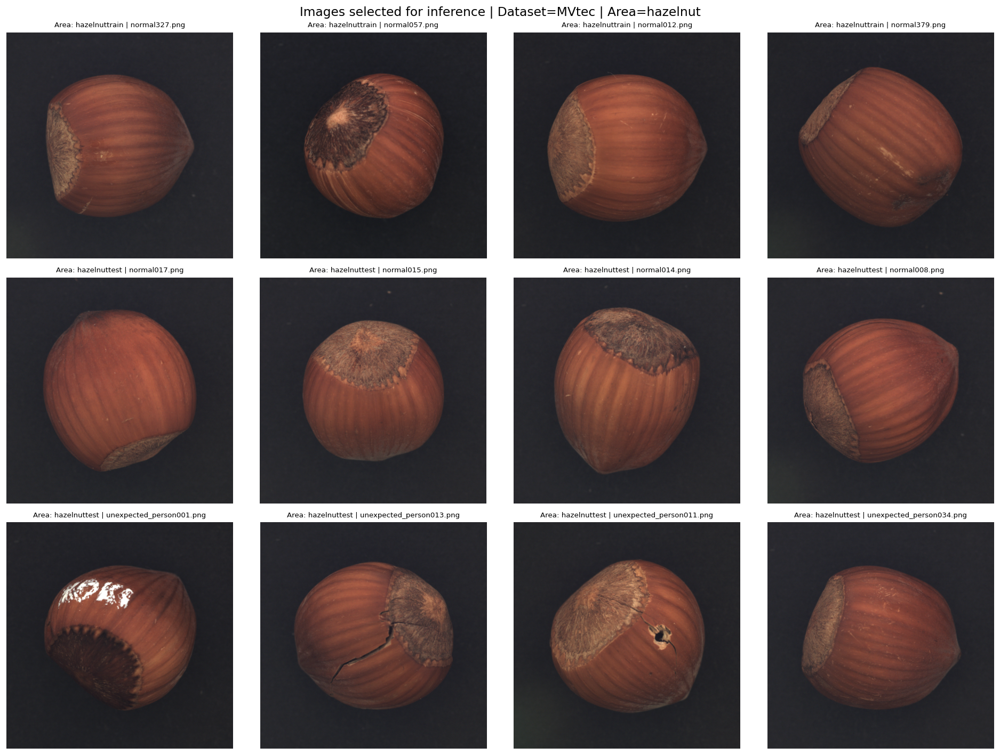

In [12]:
# ============================================================
# Sample collection and preview
# ============================================================
IMG_EXTS = ["*.png", "*.jpg", "*.jpeg", "*.bmp"]


def list_images(root):
    if root is None:
        return []
    root = Path(root)
    files = []
    for ext in IMG_EXTS:
        files.extend(root.rglob(ext))
    return sorted(files)


def pick_samples(files, n):
    files = list(files)
    if len(files) == 0:
        return []
    if len(files) <= n:
        return files
    return random.sample(files, n)


def collect_bound_samples(train_normal_root, test_normal_root, test_anomaly_root):
    train_normal = list_images(train_normal_root)
    test_normal = list_images(test_normal_root)
    test_anomaly = list_images(test_anomaly_root)

    print("=" * 80)
    print("SAMPLE COUNTS")
    print("=" * 80)
    print("Train normal:", len(train_normal), "from", train_normal_root)
    print("Test normal:", len(test_normal), "from", test_normal_root)
    print("Test anomaly:", len(test_anomaly), "from", test_anomaly_root)

    samples = []
    for p in pick_samples(train_normal, N_TRAIN_NORMAL):
        samples.append({"path": p, "split": "train", "label": "normal", "area": CANONICAL_AREA})
    for p in pick_samples(test_normal, N_TEST_NORMAL):
        samples.append({"path": p, "split": "test", "label": "normal", "area": CANONICAL_AREA})
    for p in pick_samples(test_anomaly, N_TEST_ANOMALY):
        samples.append({"path": p, "split": "test", "label": "unexpected_person", "area": CANONICAL_AREA})

    if len(samples) == 0:
        raise RuntimeError("No image samples found. Check dataset paths and extensions.")
    return samples


def show_selected_samples(samples, max_images=12):
    samples = samples[:max_images]
    cols = 4
    rows = int(np.ceil(len(samples) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, s in zip(axes, samples):
        img = Image.open(s["path"]).convert("RGB")
        ax.imshow(img)
        ax.set_title(f"Area: {s['area']}{s['split']} | {s['label']}{s['path'].name}", fontsize=8)
        ax.axis("off")

    plt.suptitle(f"Images selected for inference | Dataset={DATASET_NAME} | Area={CANONICAL_AREA}", fontsize=14)
    plt.tight_layout()
    plt.show()


samples = collect_bound_samples(train_normal_root, test_normal_root, test_anomaly_root)
show_selected_samples(samples, max_images=12)

In [13]:
# ============================================================
# Checkpoint resolution with strict dataset/model binding
# ============================================================
def infer_checkpoint_group(dataset_name):
    mapping = {
        "Cobots_Synthetic": "AD_Cobots_Synthetic",
        "Robotics_Hazards": "AD_Robotics_Hazards",
        "MVtec": "AD_MVTec",
        "AD_Cobots_Synthetic": "AD_Cobots_Synthetic",
        "AD_Robotics_Hazards": "AD_Robotics_Hazards",
        "AD_MVTec": "AD_MVTec",
    }
    return mapping.get(dataset_name, dataset_name)


def resolve_checkpoint_root(project_root, dataset_name, override=None):
    if override is not None and str(override).strip():
        return Path(override).resolve()
    return Path(project_root) / "checkpoints" / infer_checkpoint_group(dataset_name)


def find_exact_checkpoint(checkpoint_root, dataset_name, checkpoint_area, latent_dims, model_path_override=None):
    if model_path_override is not None and str(model_path_override).strip():
        p = Path(model_path_override).resolve()
        if not p.exists():
            raise FileNotFoundError(f"MODEL_PATH_OVERRIDE does not exist: {p}")
        return p

    checkpoint_root = Path(checkpoint_root)
    if not checkpoint_root.exists():
        raise FileNotFoundError(f"Checkpoint root does not exist: {checkpoint_root}")

    if dataset_name == "Cobots_Synthetic":
        candidates = [checkpoint_root / f"model_{checkpoint_area}_{latent_dims}.pt"]

    elif dataset_name == "Robotics_Hazards":
        candidates = [
            checkpoint_root / f"model_corridor_{latent_dims}.pt",
            checkpoint_root / f"model_{checkpoint_area}_{latent_dims}.pt",
        ]

    elif dataset_name == "MVtec":
        candidates = [
            checkpoint_root / f"model_{checkpoint_area}_{latent_dims}.pt",
            checkpoint_root / f"model_{str(checkpoint_area).lower()}_{latent_dims}.pt",
            checkpoint_root / str(checkpoint_area) / f"model_{checkpoint_area}_{latent_dims}.pt",
            checkpoint_root / str(checkpoint_area) / f"model_{str(checkpoint_area).lower()}_{latent_dims}.pt",
        ]

    else:
        candidates = [checkpoint_root / f"model_{checkpoint_area}_{latent_dims}.pt"]

    for p in candidates:
        if p.exists():
            return p

    all_ckpts = sorted(checkpoint_root.rglob("*.pt"))
    available = "\n".join([f"- {p.relative_to(checkpoint_root)}" for p in all_ckpts[:100]])
    expected = "\n".join([f"- {p}" for p in candidates])

    raise FileNotFoundError(
        "Expected checkpoint not found.\n\n"
        f"Dataset: {dataset_name}\n"
        f"Area/object: {checkpoint_area}\n\n"
        f"Checked:\n{expected}\n\n"
        f"Available checkpoints under {checkpoint_root}:\n{available}"
    )


CHECKPOINT_ROOT = resolve_checkpoint_root(PROJECT_ROOT, DATASET_NAME, CHECKPOINT_ROOT_OVERRIDE)

MODEL_PATH = find_exact_checkpoint(
    checkpoint_root=CHECKPOINT_ROOT,
    dataset_name=DATASET_NAME,
    checkpoint_area=CHECKPOINT_AREA,
    latent_dims=LATENT_DIMS,
    model_path_override=MODEL_PATH_OVERRIDE,
)

print("=" * 80)
print("MODEL-DATA BINDING CHECK")
print("=" * 80)
print("Dataset:", DATASET_NAME)
print("Area/object:", CANONICAL_AREA)
print("Checkpoint root:", CHECKPOINT_ROOT)
print("Selected model:", MODEL_PATH)
print("Model exists:", MODEL_PATH.exists())

if DATASET_NAME == "Cobots_Synthetic":
    expected_name = f"model_{CHECKPOINT_AREA}_{LATENT_DIMS}.pt"
    assert MODEL_PATH.name == expected_name, (
        f"Wrong Cobots model selected! Expected {expected_name}, got {MODEL_PATH.name}"
    )
    print(f"✓ Strict binding confirmed: {CHECKPOINT_AREA} data → {MODEL_PATH.name}")

elif DATASET_NAME == "Robotics_Hazards":
    expected_name = f"model_corridor_{LATENT_DIMS}.pt"
    assert MODEL_PATH.name == expected_name, (
        f"Wrong Robotics_Hazards model selected! Expected {expected_name}, got {MODEL_PATH.name}"
    )
    print(f"✓ Strict binding confirmed: corridor data → {MODEL_PATH.name}")

elif DATASET_NAME == "MVtec":
    assert str(CHECKPOINT_AREA).lower() in MODEL_PATH.name.lower() or MODEL_PATH_OVERRIDE, (
        f"Possible MVTec object/checkpoint mismatch: object={CHECKPOINT_AREA}, model={MODEL_PATH.name}"
    )
    print(f"✓ MVTec binding confirmed: {CHECKPOINT_AREA} data → {MODEL_PATH.name}")


MODEL-DATA BINDING CHECK
Dataset: MVtec
Area/object: hazelnut
Checkpoint root: E:\Cloud\RashidPHD\Codes\DistriMuSe\AD_MultiPointThreshold\checkpoints\AD_MVTec
Selected model: E:\Cloud\RashidPHD\Codes\DistriMuSe\AD_MultiPointThreshold\checkpoints\AD_MVTec\model_hazelnut_64.pt
Model exists: True
✓ MVTec binding confirmed: hazelnut data → model_hazelnut_64.pt


In [14]:
# ============================================================
# Import model classes
# ============================================================
def import_model_classes():
    errors = []
    candidates = [
        ("utils_model", ["Encoder", "Decoder", "Discriminator"]),
        ("utils_model_CAD", ["Encoder", "Decoder", "Discriminator"]),
        ("scripts.utils_model", ["Encoder", "Decoder", "Discriminator"]),
        ("models", ["Encoder", "Decoder", "Discriminator"]),
    ]

    for module_name, class_names in candidates:
        try:
            module = __import__(module_name, fromlist=class_names)
            classes = [getattr(module, c) for c in class_names]
            print(f"✓ Imported model classes from {module_name}")
            return classes
        except Exception as e:
            errors.append(f"{module_name}: {repr(e)}")

    raise ImportError("Could not import Encoder/Decoder/Discriminator. Tried:" + "".join(errors))


Encoder, Decoder, Discriminator = import_model_classes()

✓ Imported model classes from utils_model


In [15]:
# ============================================================
# Robust checkpoint loading
# ============================================================
def create_model(cls, latent_dims=None):
    if latent_dims is None:
        return cls()

    attempts = [
        lambda: cls(z_size=latent_dims),
        lambda: cls(latent_dims=latent_dims),
        lambda: cls(latent_dim=latent_dims),
        lambda: cls(latent_dims),
    ]
    last_err = None
    for fn in attempts:
        try:
            return fn()
        except Exception as e:
            last_err = e
    raise last_err


def extract_state_dict(checkpoint, possible_keys):
    for key in possible_keys:
        if key in checkpoint:
            return checkpoint[key]
    raise KeyError(f"None of these keys found in checkpoint: {possible_keys}. Available: {list(checkpoint.keys())}")


def load_vaegan_checkpoint(model_path, latent_dims, device):
    checkpoint = torch.load(model_path, map_location="cpu", weights_only=False)
    if not isinstance(checkpoint, dict):
        raise TypeError(f"Expected checkpoint dict, got {type(checkpoint)}")

    print("Checkpoint keys:", list(checkpoint.keys()))

    encoder_sd = extract_state_dict(checkpoint, ["encoder_state_dict", "encoder", "Encoder"])
    decoder_sd = extract_state_dict(checkpoint, ["decoder_state_dict", "decoder", "Decoder", "generator_state_dict", "generator"])

    encoder = create_model(Encoder, latent_dims=latent_dims)
    decoder = create_model(Decoder, latent_dims=latent_dims)

    encoder.load_state_dict(encoder_sd)
    decoder.load_state_dict(decoder_sd)

    discriminator = None
    try:
        discriminator_sd = extract_state_dict(checkpoint, ["discriminator_state_dict", "discriminator", "Discriminator"])
        discriminator = create_model(Discriminator, latent_dims=None)
        discriminator.load_state_dict(discriminator_sd)
    except Exception as e:
        print("⚠️ Discriminator not loaded:", e)

    encoder.to(device).eval()
    decoder.to(device).eval()
    if discriminator is not None:
        discriminator.to(device).eval()

    return encoder, decoder, discriminator, checkpoint


encoder, decoder, discriminator, checkpoint = load_vaegan_checkpoint(MODEL_PATH, LATENT_DIMS, device)
print(f"✓ Loaded model for {CANONICAL_AREA}: {MODEL_PATH.name}")

Checkpoint keys: ['encoder_state_dict', 'decoder_state_dict', 'discriminator_state_dict', 'optimizer_enc_state_dict', 'optimizer_dec_state_dict', 'loss_history']
✓ Loaded model for hazelnut: model_hazelnut_64.pt


In [16]:
# ============================================================
# Parameter summary and forward sanity check
# ============================================================
def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable

for name, model in [("Encoder", encoder), ("Decoder", decoder), ("Discriminator", discriminator)]:
    if model is None:
        continue
    total, trainable = count_parameters(model)
    print(f"{name}: total={total:,} | trainable={trainable:,}")

with torch.no_grad():
    dummy = torch.zeros(1, 3, IMAGE_SIZE, IMAGE_SIZE, device=device)
    mu, logvar = encoder(dummy)
    recon = decoder(mu)

print("Forward test:")
print(" input:", tuple(dummy.shape))
print(" mu:", tuple(mu.shape))
print(" logvar:", tuple(logvar.shape))
print(" recon:", tuple(recon.shape))
print(" recon range:", float(recon.min()), float(recon.max()))

Encoder: total=6,950,976 | trainable=6,950,976
Decoder: total=4,885,955 | trainable=4,885,955
Discriminator: total=8,482,369 | trainable=8,482,369
Forward test:
 input: (1, 3, 128, 128)
 mu: (1, 64)
 logvar: (1, 64)
 recon: (1, 3, 128, 128)
 recon range: -0.938287079334259 0.19335460662841797


SAMPLE COUNTS
Train normal: 391
Test normal: 40
Test anomaly total: 70

Anomaly classes / folders:
 - crack: 18 from D:\DS\AD\mvtec_preprocessed\hazelnut\test\crack
 - cut: 17 from D:\DS\AD\mvtec_preprocessed\hazelnut\test\cut
 - hole: 18 from D:\DS\AD\mvtec_preprocessed\hazelnut\test\hole
 - print: 17 from D:\DS\AD\mvtec_preprocessed\hazelnut\test\print


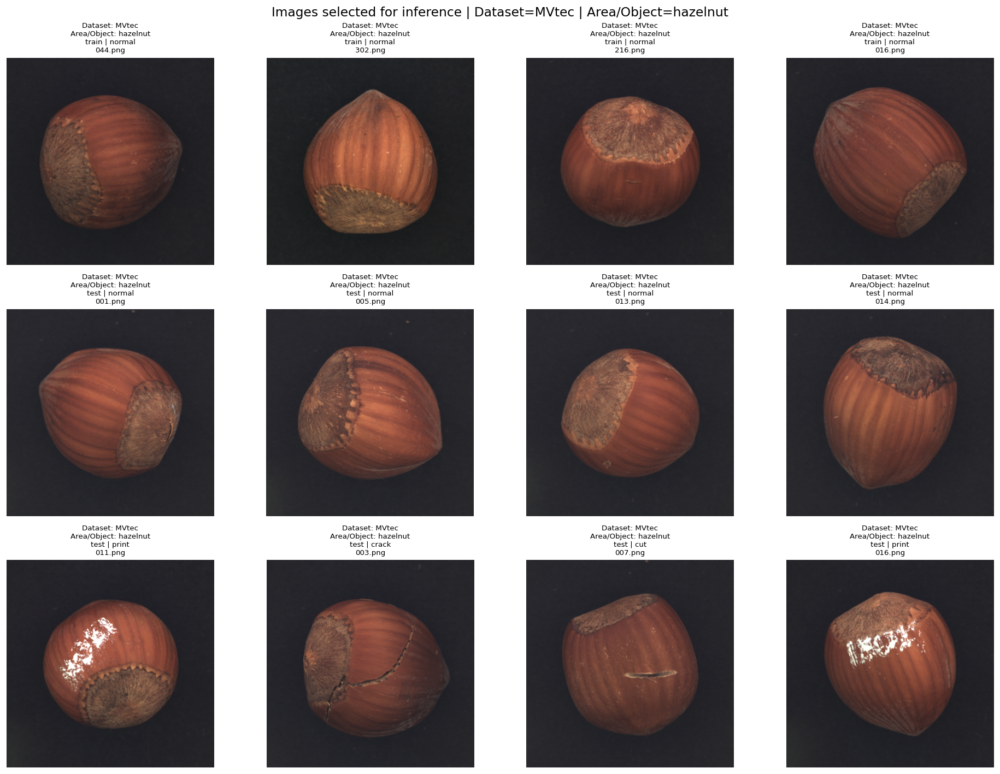

In [17]:
# ============================================================
# Sample collection and preview
# ============================================================
IMG_EXTS = ["*.png", "*.jpg", "*.jpeg", "*.bmp"]


def list_images(root):
    if root is None:
        return []
    root = Path(root)
    if not root.exists():
        return []
    files = []
    for ext in IMG_EXTS:
        files.extend(root.rglob(ext))
    return sorted(files)


def pick_samples(files, n):
    files = list(files)
    if len(files) == 0 or n <= 0:
        return []
    if len(files) <= n:
        return files
    return random.sample(files, n)


def collect_samples_from_adapter(adapter):
    train_normal_files = []
    test_normal_files = []
    anomaly_files_by_root = {}

    for root in adapter["train_normal_roots"]:
        train_normal_files.extend(list_images(root))

    for root in adapter["test_normal_roots"]:
        test_normal_files.extend(list_images(root))

    for root in adapter["test_anomaly_roots"]:
        anomaly_files_by_root[Path(root)] = list_images(root)

    print("=" * 80)
    print("SAMPLE COUNTS")
    print("=" * 80)
    print("Train normal:", len(train_normal_files))
    print("Test normal:", len(test_normal_files))
    print("Test anomaly total:", sum(len(v) for v in anomaly_files_by_root.values()))

    if len(anomaly_files_by_root) > 0:
        print("\nAnomaly classes / folders:")
        for root, files in anomaly_files_by_root.items():
            print(f" - {root.name}: {len(files)} from {root}")

    samples = []

    for p in pick_samples(train_normal_files, N_TRAIN_NORMAL):
        samples.append({
            "path": p,
            "split": "train",
            "label": "normal",
            "area": CANONICAL_AREA,
            "source_folder": Path(p).parent.name,
        })

    for p in pick_samples(test_normal_files, N_TEST_NORMAL):
        samples.append({
            "path": p,
            "split": "test",
            "label": "normal",
            "area": CANONICAL_AREA,
            "source_folder": Path(p).parent.name,
        })

    # To avoid overloading the notebook, sample anomaly images across folders.
    anomaly_roots = list(anomaly_files_by_root.keys())

    if DATASET_NAME == "Robotics_Hazards":
        # Robotics has many anomaly classes. Sample one or a few per class.
        per_class = max(1, min(N_TEST_ANOMALY, 2))
        for root in anomaly_roots:
            files = anomaly_files_by_root[root]
            for p in pick_samples(files, per_class):
                samples.append({
                    "path": p,
                    "split": "test",
                    "label": root.name,
                    "area": CANONICAL_AREA,
                    "source_folder": root.name,
                })
    else:
        # Cobots and MVTec usually have fewer anomaly roots.
        all_anomaly_files = []
        for root, files in anomaly_files_by_root.items():
            for p in files:
                all_anomaly_files.append((p, root.name))

        for p, label in pick_samples(all_anomaly_files, N_TEST_ANOMALY):
            samples.append({
                "path": p,
                "split": "test",
                "label": label,
                "area": CANONICAL_AREA,
                "source_folder": label,
            })

    if len(samples) == 0:
        raise RuntimeError("No image samples found. Check dataset adapter paths and image extensions.")

    return samples


def show_selected_samples(samples, max_images=12):
    samples = samples[:max_images]
    cols = 4
    rows = int(np.ceil(len(samples) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, s in zip(axes, samples):
        img = Image.open(s["path"]).convert("RGB")
        ax.imshow(img)
        ax.set_title(
            f"Dataset: {DATASET_NAME}\n"
            f"Area/Object: {s['area']}\n"
            f"{s['split']} | {s['label']}\n"
            f"{Path(s['path']).name}",
            fontsize=8,
        )
        ax.axis("off")

    plt.suptitle(
        f"Images selected for inference | Dataset={DATASET_NAME} | Area/Object={CANONICAL_AREA}",
        fontsize=14,
    )
    plt.tight_layout()
    plt.show()


samples = collect_samples_from_adapter(adapter)
show_selected_samples(samples, max_images=12)


In [18]:
# ============================================================
# Image transform and reconstruction utilities
# ============================================================
model_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])


def denorm(x):
    return torch.clamp((x * 0.5) + 0.5, 0, 1)


def load_image_tensor(image_path, device):
    img = Image.open(image_path).convert("RGB")
    x = model_transform(img).unsqueeze(0).to(device)
    return x, img


def reconstruct_tensor(x, encoder, decoder, use_mu=True):
    with torch.no_grad():
        mu, logvar = encoder(x)
        if use_mu:
            z = mu
        else:
            std = torch.exp(0.5 * logvar)
            eps = torch.randn_like(std)
            z = mu + eps * std
        recon = decoder(z)
    return recon, mu, logvar


def compute_scores(x, recon):
    diff = torch.abs(x - recon)
    diff_map = diff.mean(dim=1)[0]
    return {
        "mae": diff.mean().item(),
        "mse": torch.mean((x - recon) ** 2).item(),
        "max": diff_map.max().item(),
        "q90": torch.quantile(diff_map.flatten(), 0.90).item(),
        "q95": torch.quantile(diff_map.flatten(), 0.95).item(),
        "q99": torch.quantile(diff_map.flatten(), 0.99).item(),
    }, diff_map

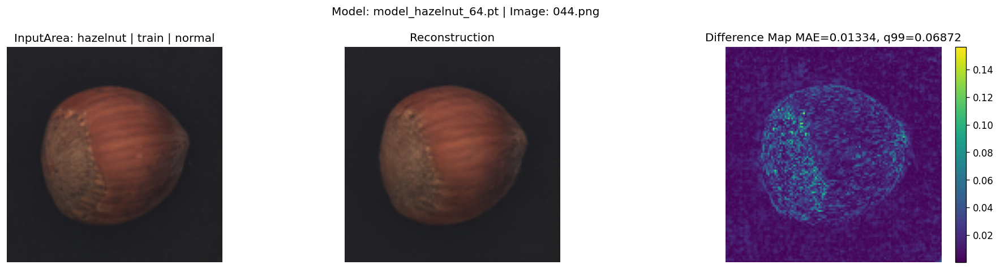

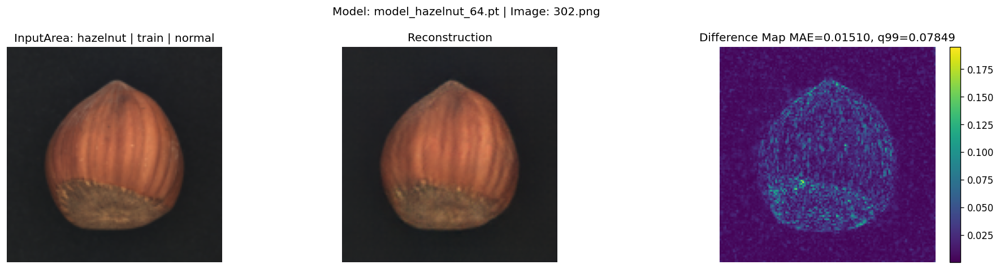

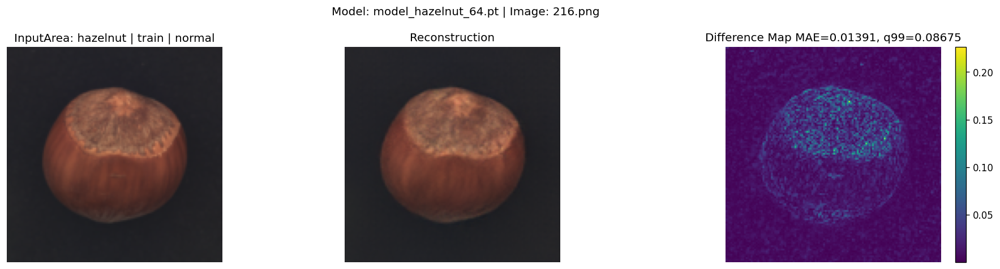

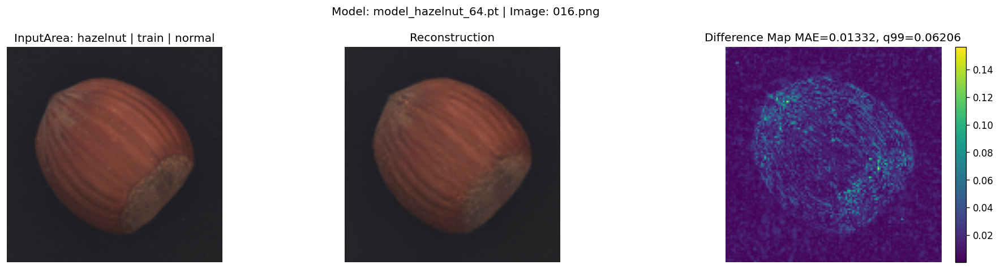

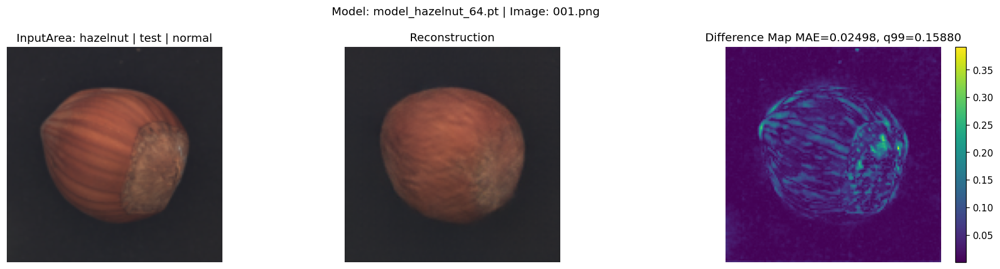

...

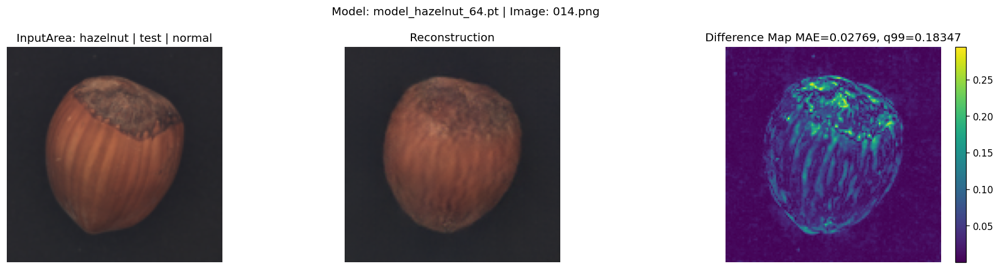

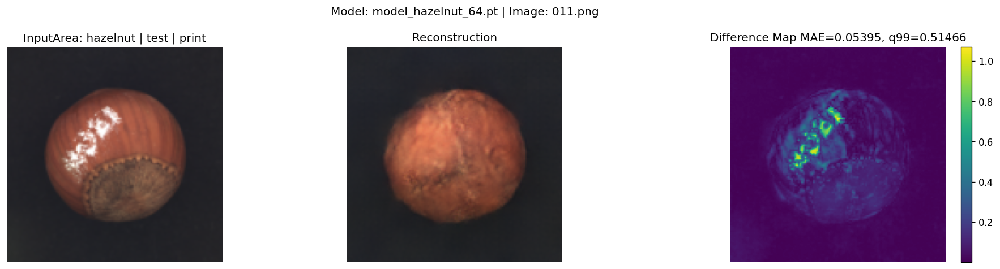

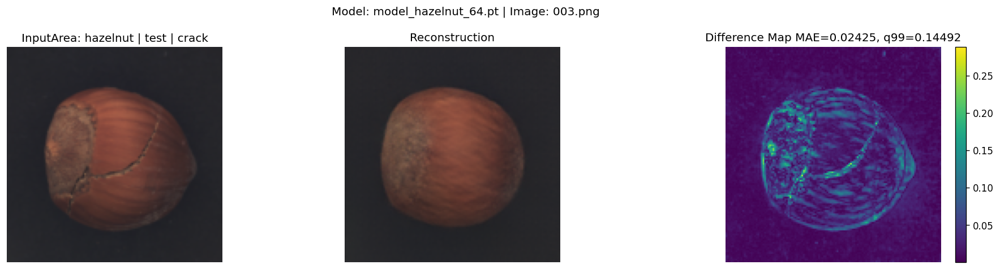

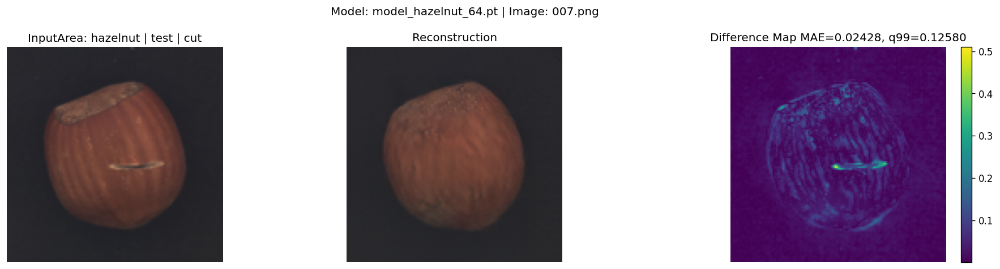

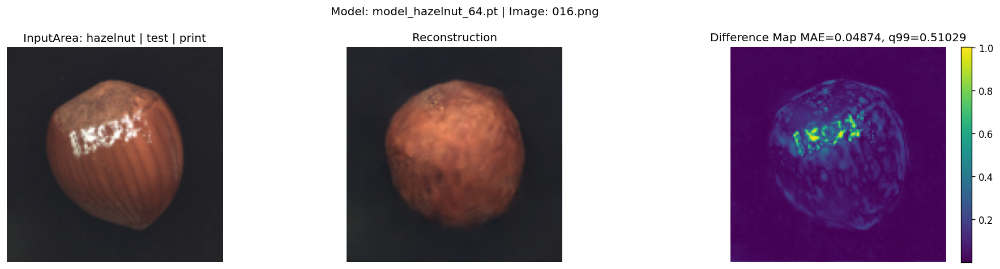

Done. Samples tested: 12


In [19]:
# ============================================================
# Plot reconstruction results
# ============================================================
def plot_reconstruction_sample(sample, encoder, decoder, device, use_mu=True):
    image_path = sample["path"]
    x, _ = load_image_tensor(image_path, device)
    recon, mu, logvar = reconstruct_tensor(x, encoder, decoder, use_mu=use_mu)
    scores, diff_map = compute_scores(x, recon)

    x_vis = denorm(x[0]).detach().cpu().permute(1, 2, 0).numpy()
    recon_vis = denorm(recon[0]).detach().cpu().permute(1, 2, 0).numpy()
    diff_np = diff_map.detach().cpu().numpy()

    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    axes[0].imshow(x_vis)
    axes[0].set_title(f"InputArea: {sample['area']} | {sample['split']} | {sample['label']}")
    axes[0].axis("off")

    axes[1].imshow(recon_vis)
    axes[1].set_title("Reconstruction")
    axes[1].axis("off")

    im = axes[2].imshow(diff_np)
    axes[2].set_title(f"Difference Map MAE={scores['mae']:.5f}, q99={scores['q99']:.5f}")
    axes[2].axis("off")
    plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

    plt.suptitle(f"Model: {MODEL_PATH.name} | Image: {Path(image_path).name}", fontsize=12)
    plt.tight_layout()
    plt.show()

    row = dict(scores)
    row.update({
        "area": sample["area"],
        "split": sample["split"],
        "label": sample["label"],
        "path": str(image_path),
        "model": MODEL_PATH.name,
    })
    return row


results = []
for sample in samples:
    results.append(plot_reconstruction_sample(sample, encoder, decoder, device, use_mu=True))

print("Done. Samples tested:", len(results))

In [20]:
# ============================================================
# Checkpoint loading with architecture diagnostics
# ============================================================
def create_model(cls, latent_dims=None):
    if latent_dims is None:
        return cls()

    attempts = [
        ("z_size", lambda: cls(z_size=latent_dims)),
        ("latent_dims", lambda: cls(latent_dims=latent_dims)),
        ("latent_dim", lambda: cls(latent_dim=latent_dims)),
        ("positional", lambda: cls(latent_dims)),
    ]

    errors = []
    for name, fn in attempts:
        try:
            model = fn()
            print(f"✓ Created {cls.__name__} using constructor style: {name}")
            return model
        except Exception as e:
            errors.append((name, repr(e)))

    raise RuntimeError(f"Could not instantiate {cls.__name__}. Tried: {errors}")


def extract_state_dict(checkpoint, possible_keys):
    for key in possible_keys:
        if key in checkpoint:
            return checkpoint[key], key
    raise KeyError(
        f"None of these keys found in checkpoint: {possible_keys}. "
        f"Available: {list(checkpoint.keys())}"
    )


def print_state_dict_diagnostics(model, state_dict, model_name):
    model_keys = set(model.state_dict().keys())
    ckpt_keys = set(state_dict.keys())

    missing = sorted(model_keys - ckpt_keys)
    unexpected = sorted(ckpt_keys - model_keys)

    print("\n" + "=" * 80)
    print(f"{model_name} STATE-DICT DIAGNOSTICS")
    print("=" * 80)
    print("Model keys:", len(model_keys))
    print("Checkpoint keys:", len(ckpt_keys))
    print("Missing keys:", len(missing))
    print("Unexpected keys:", len(unexpected))

    if missing:
        print("\nFirst missing keys:")
        for k in missing[:12]:
            print(" -", k)

    if unexpected:
        print("\nFirst unexpected keys:")
        for k in unexpected[:12]:
            print(" -", k)

    print("\nShape mismatches:")
    shown = 0
    model_sd = model.state_dict()
    for k in sorted(model_keys & ckpt_keys):
        if tuple(model_sd[k].shape) != tuple(state_dict[k].shape):
            print(f" - {k}: model {tuple(model_sd[k].shape)} vs ckpt {tuple(state_dict[k].shape)}")
            shown += 1
            if shown >= 12:
                break


def load_state_dict_strict_with_help(model, state_dict, model_name):
    try:
        model.load_state_dict(state_dict, strict=True)
        print(f"✓ {model_name} weights loaded strictly")
    except RuntimeError as e:
        print_state_dict_diagnostics(model, state_dict, model_name)
        raise RuntimeError(
            f"\nFailed to load {model_name} weights strictly.\n"
            "This means the imported model class does not match the checkpoint architecture.\n"
            "Check that the notebook imports the same Encoder/Decoder definitions used during training.\n"
            "Common cause: loading a checkpoint trained with utils_model_CAD.py using a different utils_model.py.\n\n"
            f"Original PyTorch error:\n{e}"
        )


def load_vaegan_checkpoint(model_path, latent_dims, device):
    model_path = Path(model_path)
    if not model_path.exists():
        raise FileNotFoundError(f"Checkpoint does not exist: {model_path}")

    checkpoint = torch.load(model_path, map_location="cpu", weights_only=False)

    if not isinstance(checkpoint, dict):
        raise TypeError(f"Expected checkpoint dict, got {type(checkpoint)}")

    print("=" * 80)
    print("CHECKPOINT")
    print("=" * 80)
    print("Path:", model_path)
    print("Keys:", list(checkpoint.keys()))

    encoder_sd, encoder_key = extract_state_dict(
        checkpoint,
        ["encoder_state_dict", "encoder", "Encoder"],
    )
    decoder_sd, decoder_key = extract_state_dict(
        checkpoint,
        ["decoder_state_dict", "decoder", "Decoder", "generator_state_dict", "generator"],
    )

    print("Encoder state key:", encoder_key)
    print("Decoder state key:", decoder_key)

    encoder = create_model(Encoder, latent_dims=latent_dims)
    decoder = create_model(Decoder, latent_dims=latent_dims)

    load_state_dict_strict_with_help(encoder, encoder_sd, "Encoder")
    load_state_dict_strict_with_help(decoder, decoder_sd, "Decoder")

    discriminator = None
    try:
        discriminator_sd, discriminator_key = extract_state_dict(
            checkpoint,
            ["discriminator_state_dict", "discriminator", "Discriminator"],
        )
        discriminator = create_model(Discriminator, latent_dims=None)
        load_state_dict_strict_with_help(discriminator, discriminator_sd, "Discriminator")
        print("Discriminator state key:", discriminator_key)
    except Exception as e:
        print("⚠️ Discriminator not loaded:", e)

    encoder.to(device).eval()
    decoder.to(device).eval()
    if discriminator is not None:
        discriminator.to(device).eval()

    return encoder, decoder, discriminator, checkpoint


encoder, decoder, discriminator, checkpoint = load_vaegan_checkpoint(MODEL_PATH, LATENT_DIMS, device)
print(f"✓ Loaded model for {CANONICAL_AREA}: {MODEL_PATH.name}")


CHECKPOINT
Path: E:\Cloud\RashidPHD\Codes\DistriMuSe\AD_MultiPointThreshold\checkpoints\AD_MVTec\model_hazelnut_64.pt
Keys: ['encoder_state_dict', 'decoder_state_dict', 'discriminator_state_dict', 'optimizer_enc_state_dict', 'optimizer_dec_state_dict', 'loss_history']
Encoder state key: encoder_state_dict
Decoder state key: decoder_state_dict
✓ Created Encoder using constructor style: z_size
✓ Created Decoder using constructor style: z_size
✓ Encoder weights loaded strictly
✓ Decoder weights loaded strictly
✓ Discriminator weights loaded strictly
Discriminator state key: discriminator_state_dict
✓ Loaded model for hazelnut: model_hazelnut_64.pt


## Optional: compare score distributions

mae       mse       q95       q99
area     split label                                         
hazelnut test  crack   0.024251  0.001815  0.086599  0.144921
               cut     0.024276  0.001587  0.074311  0.125796
               normal  0.026019  0.002359  0.100743  0.173224
               print   0.051341  0.014999  0.198691  0.512473
         train normal  0.013914  0.000496  0.043500  0.074004

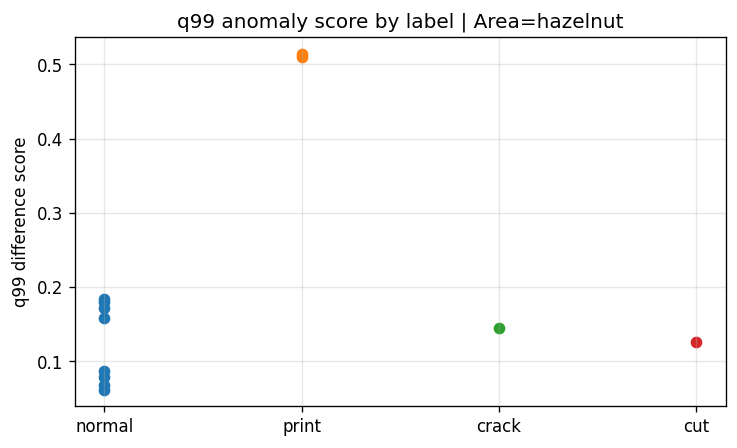

In [21]:
try:
    import pandas as pd
    df = pd.DataFrame(results)
    if not df.empty:
        display(df.groupby(["area", "split", "label"])[["mae", "mse", "q95", "q99"]].mean())

        labels = df["label"].unique().tolist()
        if len(labels) > 1:
            plt.figure(figsize=(7, 4))
            for label in labels:
                vals = df[df["label"] == label]["q99"].values
                plt.scatter([label] * len(vals), vals)
            plt.title(f"q99 anomaly score by label | Area={CANONICAL_AREA}")
            plt.ylabel("q99 difference score")
            plt.grid(True, alpha=0.3)
            plt.show()
except Exception as e:
    print("Could not summarize results:", e)

mae                     mse                     q95  \
                 mean      std count     mean      std count     mean   
binary_label                                                            
normal        0.02591  0.01314    12  0.00374  0.00534    12  0.09461   

                                 q99                 
                  std count     mean      std count  
binary_label                                         
normal        0.05493    12  0.19038  0.15661    12

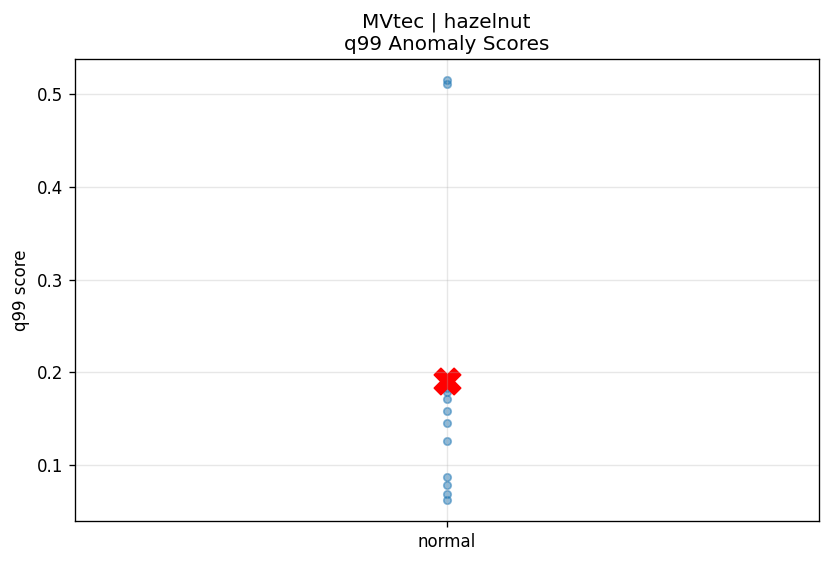

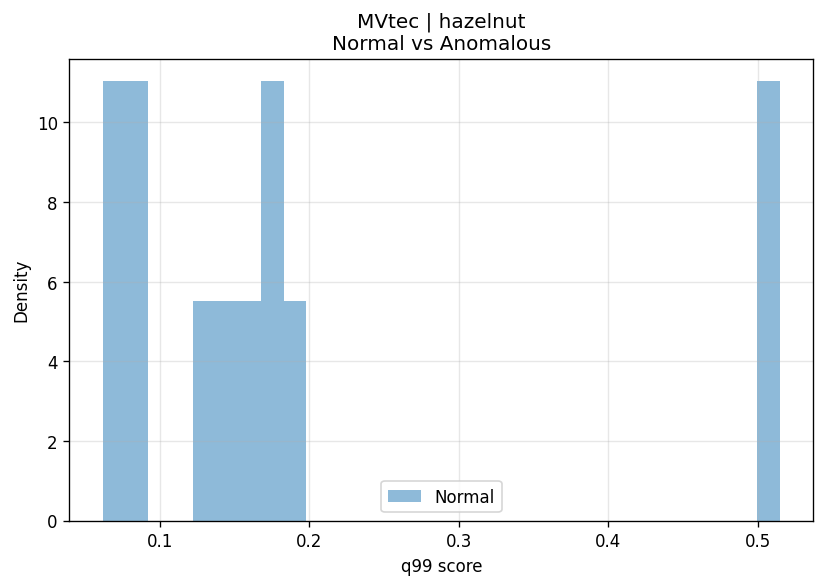

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df = pd.DataFrame(results)

if len(df) == 0:
    print("No results available")
else:

    # ==========================================================
    # Convert dataset-specific labels to binary labels
    # ==========================================================
    if DATASET_NAME == "Robotics_Hazards":

        anomaly_classes = [
            "box", "cable", "cellophane", "clutter",
            "cones", "debris", "defects", "door",
            "floor", "foam", "human", "misc",
            "obj_on_robot", "obj_on_robot2",
            "sawdust", "screws", "shard",
            "tape", "trolley", "water"
        ]

        df["binary_label"] = np.where(
            df["label"].isin(anomaly_classes),
            "anomalous",
            "normal"
        )

    else:
        # Cobots + MVtec
        df["binary_label"] = np.where(
            df["label"].str.contains(
                "anom|defect|unexpected_person",
                case=False,
                regex=True
            ),
            "anomalous",
            "normal"
        )

    # ==========================================================
    # Summary table
    # ==========================================================
    summary = (
        df.groupby("binary_label")[["mae", "mse", "q95", "q99"]]
        .agg(["mean", "std", "count"])
        .round(5)
    )

    display(summary)

    # ==========================================================
    # Scatter plot
    # ==========================================================
    plt.figure(figsize=(8, 5))

    for label in ["normal", "anomalous"]:

        vals = df[df["binary_label"] == label]["q99"]

        plt.scatter(
            [label] * len(vals),
            vals,
            alpha=0.5,
            s=20
        )

        if len(vals) > 0:
            plt.scatter(
                label,
                vals.mean(),
                marker="X",
                s=250,
                color="red"
            )

    plt.title(
        f"{DATASET_NAME} | {CANONICAL_AREA}\n"
        f"q99 Anomaly Scores"
    )

    plt.ylabel("q99 score")
    plt.grid(alpha=0.3)
    plt.show()

    # ==========================================================
    # Histogram
    # ==========================================================
    plt.figure(figsize=(8, 5))

    normal_scores = df[df["binary_label"] == "normal"]["q99"]

    anomaly_scores = df[df["binary_label"] == "anomalous"]["q99"]

    if len(normal_scores) > 0:
        plt.hist(
            normal_scores,
            bins=30,
            alpha=0.5,
            density=True,
            label="Normal"
        )

    if len(anomaly_scores) > 0:
        plt.hist(
            anomaly_scores,
            bins=30,
            alpha=0.5,
            density=True,
            label="Anomalous"
        )

    plt.xlabel("q99 score")
    plt.ylabel("Density")
    plt.title(
        f"{DATASET_NAME} | {CANONICAL_AREA}\n"
        "Normal vs Anomalous"
    )
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

    # ==========================================================
    # Separation statistics
    # ==========================================================
    if len(normal_scores) > 0 and len(anomaly_scores) > 0:

        print("=" * 80)
        print("NORMAL VS ANOMALOUS")
        print("=" * 80)

        print(f"Normal mean:    {normal_scores.mean():.6f}")
        print(f"Anomalous mean: {anomaly_scores.mean():.6f}")
        print(
            f"Ratio:          "
            f"{anomaly_scores.mean()/normal_scores.mean():.3f}x"
        )